## Introduction

Prognostic Health Management (PHM) plays an important role in any organization's competitive advantage as it assists in improving reliability, maintainability, safety, and affordability. PHM is the surveillance of system state and the assessment of product life in systems using non-destructive assessment of underlying damage.

One of the most widely used methods of measuring PHM data are sensors. Sensors come in all shapes, sizes and functions and measure different aspects of environmental and operational effects. Environmental examples are temerature, humidity, outside pressure and air monitoring. Operational examples are vibration, pressure, temperature and flow rate.

The following project will focus on predicting the useful life of a machine based on sensor data provided up to a certain cycle. 

## Dataset

The dataset was collected from the PHM Society. The following data information was obtained from the readme attached with the data.

- Data Set: FD001
- Train trjectories: 100
- Test trajectories: 100
- Conditions: ONE (Sea Level)
- Fault Modes: ONE (HPC Degradation)

Data sets consists of multiple multivariate time series. Each data set is further divided into training and test subsets. Each time series is from a different engine – i.e., the data can be considered to be from a fleet of engines of the same type. Each engine starts with different degrees of initial wear and manufacturing variation which is unknown to the user. This wear and variation is considered normal, i.e., it is not considered a fault condition. There are three operational settings that have a substantial effect on engine performance. These settings are also included in the data. The data is contaminated with sensor noise.

The engine is operating normally at the start of each time series, and develops a fault at some point during the series. In the training set, the fault grows in magnitude until system failure. In the test set, the time series ends some time prior to system failure. The objective of the competition is to predict the number of remaining operational cycles before failure in the test set, i.e., the number of operational cycles after the last cycle that the engine will continue to operate. Also provided a vector of true Remaining Useful Life (RUL) values for the test data.

The data are provided as a zip-compressed text file with 26 columns of numbers, separated by spaces. Each row is a snapshot of data taken during a single operational cycle, each column is a different variable. The columns correspond to:

-	unit number
-	time, in cycles
-	operational setting 1
-	operational setting 2
-	operational setting 3
-   sensor measurement  1
- 	sensor measurement  2
- ...
- 	sensor measurement  26

Reference: A. Saxena, K. Goebel, D. Simon, and N. Eklund, “Damage Propagation Modeling for Aircraft Engine Run-to-Failure Simulation”, in the Proceedings of the Ist International Conference on Prognostics and Health Management (PHM08), Denver CO, Oct 2008.


## Import Packages

In [131]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
from sklearn.preprocessing import StandardScaler, RobustScaler
import statsmodels.api as sm
from statsmodels.formula.api import ols
import xgboost as xgb
from sklearn.metrics import accuracy_score, mean_squared_error
from sklearn.model_selection import cross_val_score, GridSearchCV, train_test_split
from sklearn.model_selection import GridSearchCV
from keras import models,layers,regularizers

## Load Dataset

In [2]:
train = pd.read_table('train_FD001.txt', sep=' ', header=None)
test = pd.read_table('test_FD001.txt', sep=' ', header=None)
test_target = pd.read_table('RUL_FD001.txt', sep=' ', header=None)

In [3]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20631 entries, 0 to 20630
Data columns (total 28 columns):
0     20631 non-null int64
1     20631 non-null int64
2     20631 non-null float64
3     20631 non-null float64
4     20631 non-null float64
5     20631 non-null float64
6     20631 non-null float64
7     20631 non-null float64
8     20631 non-null float64
9     20631 non-null float64
10    20631 non-null float64
11    20631 non-null float64
12    20631 non-null float64
13    20631 non-null float64
14    20631 non-null float64
15    20631 non-null float64
16    20631 non-null float64
17    20631 non-null float64
18    20631 non-null float64
19    20631 non-null float64
20    20631 non-null float64
21    20631 non-null int64
22    20631 non-null int64
23    20631 non-null float64
24    20631 non-null float64
25    20631 non-null float64
26    0 non-null float64
27    0 non-null float64
dtypes: float64(24), int64(4)
memory usage: 4.4 MB


In [4]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13096 entries, 0 to 13095
Data columns (total 28 columns):
0     13096 non-null int64
1     13096 non-null int64
2     13096 non-null float64
3     13096 non-null float64
4     13096 non-null float64
5     13096 non-null float64
6     13096 non-null float64
7     13096 non-null float64
8     13096 non-null float64
9     13096 non-null float64
10    13096 non-null float64
11    13096 non-null float64
12    13096 non-null float64
13    13096 non-null float64
14    13096 non-null float64
15    13096 non-null float64
16    13096 non-null float64
17    13096 non-null float64
18    13096 non-null float64
19    13096 non-null float64
20    13096 non-null float64
21    13096 non-null int64
22    13096 non-null int64
23    13096 non-null float64
24    13096 non-null float64
25    13096 non-null float64
26    0 non-null float64
27    0 non-null float64
dtypes: float64(24), int64(4)
memory usage: 2.8 MB


In [5]:
train.reset_index(inplace=True, drop=True)
test.reset_index(inplace=True, drop=True)

In [6]:
train.drop([26,27], axis=1, inplace=True)
test.drop([26,27], axis=1, inplace=True)

In [7]:
train.set_axis(['unit', 'cycle', 'os1', 'os2', 'os3', 'm1', 'm2', 'm3', 'm4', 'm5', \
            'm6', 'm7', 'm8', 'm9', 'm10', 'm11', 'm12', 'm13', 'm14', 'm15', \
            'm16', 'm17', 'm18', 'm19', 'm20', 'm21'], axis=1, inplace=True)
test.set_axis(['unit', 'cycle', 'os1', 'os2', 'os3', 'm1', 'm2', 'm3', 'm4', 'm5', \
            'm6', 'm7', 'm8', 'm9', 'm10', 'm11', 'm12', 'm13', 'm14', 'm15', \
            'm16', 'm17', 'm18', 'm19', 'm20', 'm21'], axis=1, inplace=True)

In [8]:
train.head()

,unit,cycle,os1,os2,os3,m1,m2,m3,m4,m5,...,m12,m13,m14,m15,m16,m17,m18,m19,m20,m21
0,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.70,1400.60,14.62,...,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.4190
1,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,...,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.00,23.4236
2,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.20,14.62,...,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
3,1,4,0.0007,0.0000,100.0,518.67,642.35,1582.79,1401.87,14.62,...,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
4,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,...,522.19,2388.04,8133.80,8.4294,0.03,393,2388,100.0,38.90,23.4044


In [9]:
test.head()

,unit,cycle,os1,os2,os3,m1,m2,m3,m4,m5,...,m12,m13,m14,m15,m16,m17,m18,m19,m20,m21
0,1,1,0.0023,0.0003,100.0,518.67,643.02,1585.29,1398.21,14.62,...,521.72,2388.03,8125.55,8.4052,0.03,392,2388,100.0,38.86,23.3735
1,1,2,-0.0027,-0.0003,100.0,518.67,641.71,1588.45,1395.42,14.62,...,522.16,2388.06,8139.62,8.3803,0.03,393,2388,100.0,39.02,23.3916
2,1,3,0.0003,0.0001,100.0,518.67,642.46,1586.94,1401.34,14.62,...,521.97,2388.03,8130.10,8.4441,0.03,393,2388,100.0,39.08,23.4166
3,1,4,0.0042,0.0000,100.0,518.67,642.44,1584.12,1406.42,14.62,...,521.38,2388.05,8132.90,8.3917,0.03,391,2388,100.0,39.00,23.3737
4,1,5,0.0014,0.0000,100.0,518.67,642.51,1587.19,1401.92,14.62,...,522.15,2388.03,8129.54,8.4031,0.03,390,2388,100.0,38.99,23.4130


## Explore Train Data

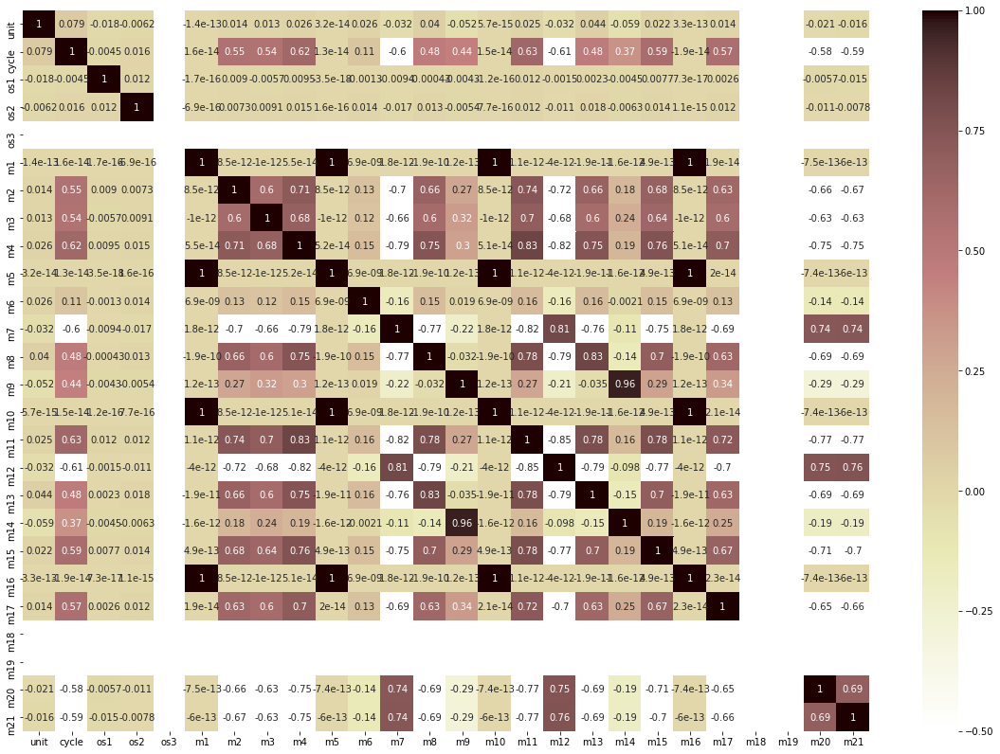

In [10]:
#heat map to find multicollinearity between features
correlation = train.corr() 
plt.figure(figsize=(20,14)) 
heatmap = sns.heatmap(correlation, annot=True, linewidths = 0, vmin=-.5, cmap='pink_r')

There are a few features that correlate to each other. We will eliminate those features as well as the features that do not change during sampling.

In [11]:
train.drop(['m1', 'm5','m6', 'm10', 'm16', 'm18', 'm19','os3'], axis=1, inplace=True)
test.drop(['m1', 'm5', 'm6', 'm10','m16', 'm18', 'm19','os3'], axis=1, inplace=True)

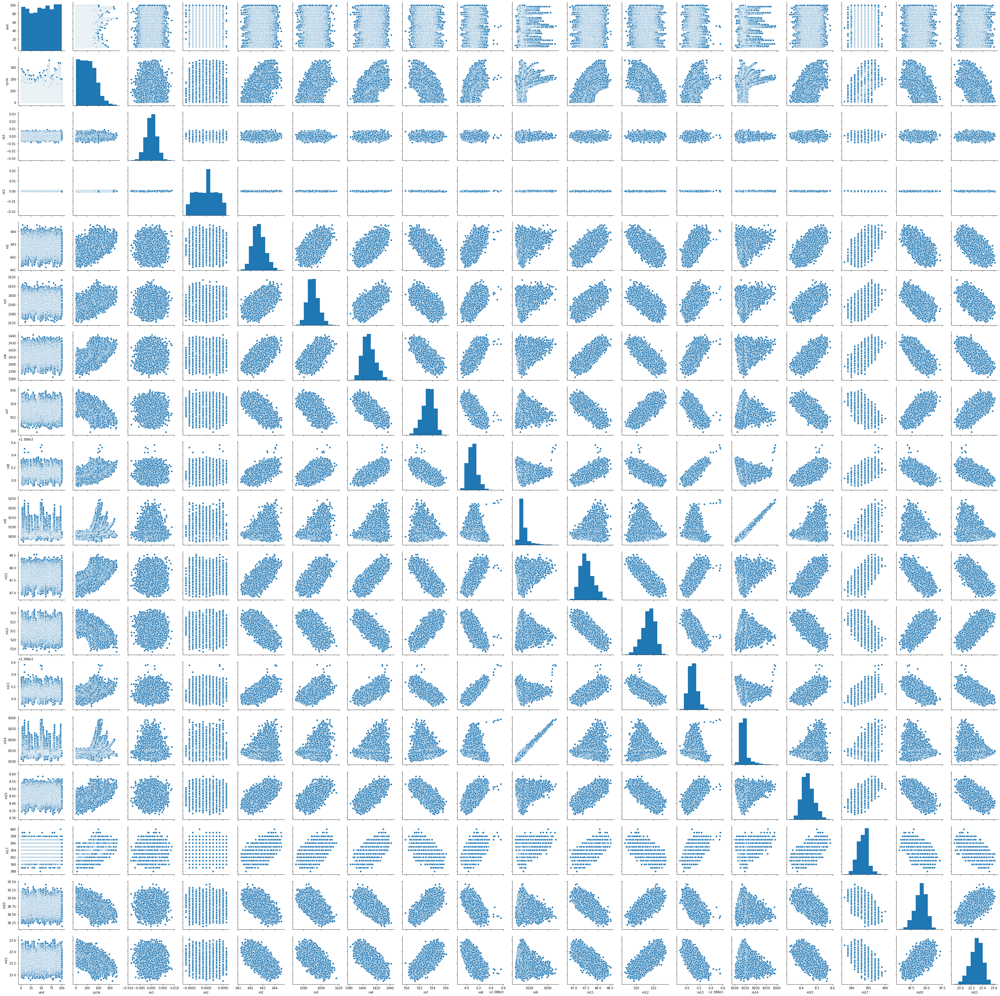

In [12]:
#pairplot to check linear relationships and sample distribution
sns.pairplot(train);

The measurements here are very Gaussian in nature and most have some form of linear relationship to the other. 

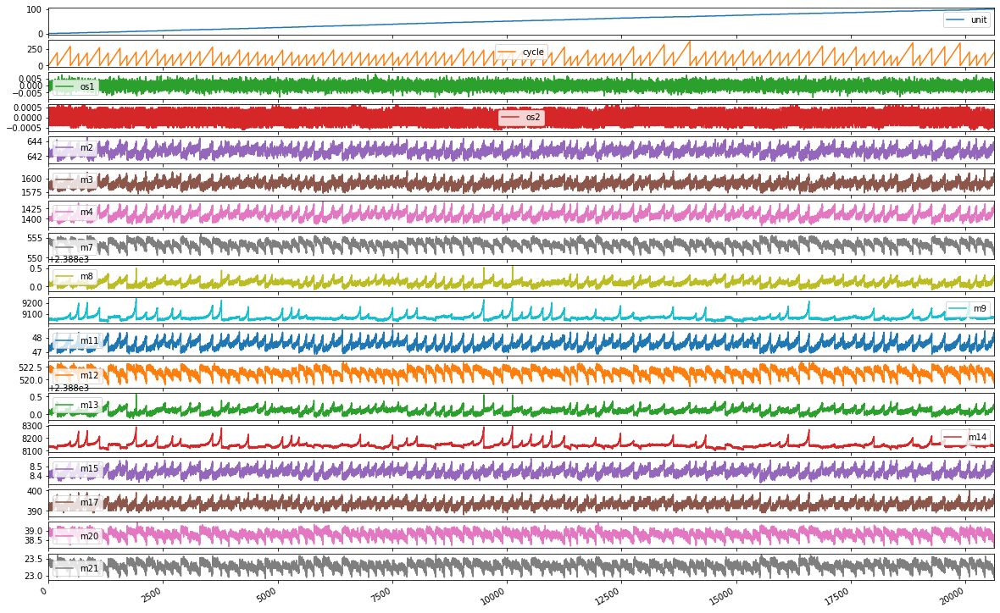

In [13]:
#time series line plots
train.plot(figsize=(20,20), subplots=True, layout=(26,1));

Here we can see that during each cycle, there seems to be a trend on how the measurements change as the machine reaches a failure point. 

### Target Engineering

The original data did not come with a designated target. Since we are attempting to predict remaining useful life, we will need to engineer a target from our known features 'cycle' and 'unit'. The result will be a percentage of remaining useful life that will be used as our target.

In [14]:
'''While loop to locate each cycle per unit, sort in reverse order\
and find the percentage of remaining life to append to a list '''
unit = 1
rul_perc = []
while unit <= 100:
    cycles = train['cycle'][train['unit']==unit].values
    val = sorted(cycles, reverse=True)
    percent = [i / max(val) for i in val]
    rul_perc.append(percent)
    unit = unit + 1

In [15]:
#check
rul_perc

[[1.0,
  0.9947916666666666,
  0.9895833333333334,
  0.984375,
  0.9791666666666666,
  0.9739583333333334,
  0.96875,
  0.9635416666666666,
  0.9583333333333334,
  0.953125,
  0.9479166666666666,
  0.9427083333333334,
  0.9375,
  0.9322916666666666,
  0.9270833333333334,
  0.921875,
  0.9166666666666666,
  0.9114583333333334,
  0.90625,
  0.9010416666666666,
  0.8958333333333334,
  0.890625,
  0.8854166666666666,
  0.8802083333333334,
  0.875,
  0.8697916666666666,
  0.8645833333333334,
  0.859375,
  0.8541666666666666,
  0.8489583333333334,
  0.84375,
  0.8385416666666666,
  0.8333333333333334,
  0.828125,
  0.8229166666666666,
  0.8177083333333334,
  0.8125,
  0.8072916666666666,
  0.8020833333333334,
  0.796875,
  0.7916666666666666,
  0.7864583333333334,
  0.78125,
  0.7760416666666666,
  0.7708333333333334,
  0.765625,
  0.7604166666666666,
  0.7552083333333334,
  0.75,
  0.7447916666666666,
  0.7395833333333334,
  0.734375,
  0.7291666666666666,
  0.7239583333333334,
  0.71875,
 

In [16]:
#converts list of arrays to a flattened list and adds to df
train['target'] = list(itertools.chain(*rul_perc))

In [17]:
train.head()

,unit,cycle,os1,os2,m2,m3,m4,m7,m8,m9,m11,m12,m13,m14,m15,m17,m20,m21,target
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,1.000000
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,0.994792
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,0.989583
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,0.984375
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,0.979167


Before we start to preprocess the data, we want to separate out our continuous data that won't be filtered as well as our categorical data.

In [18]:
train_cont=train.drop(['unit', 'cycle','os2','target'], axis=1)
test_cont=test.drop(['unit', 'cycle','os2'], axis=1)

In [19]:
train_cat = train[['unit','cycle','os2']]
test_cat = test[['unit','cycle','os2']]

### Kalman Filter

Our first preprocessing method is the Kalman Filter. Usage of the Kalman filter acknowledges that some error and noise is implicit within both the prediction and measurement of the variables we’re interested in tracking. The Kalman filter represents all distributions by Gaussians and iterates over two different things: measurement updates and motion updates. Measurement updates involve updating a prior with a product of a certain belief, while motion updates involve performing a convolution.

In [20]:
# A Python implementation of the example given in pages 11-15 of "An
# Introduction to the Kalman Filter" by Greg Welch and Gary Bishop,
# University of North Carolina at Chapel Hill, Department of Computer
# Science, TR 95-041,
# https://www.cs.unc.edu/~welch/media/pdf/kalman_intro.pdf

# by Andrew D. Straw
filtered = pd.DataFrame()
sz = len(train.index,)
# allocate space for arrays
xhat=np.zeros(sz)      # a posteri estimate of x
P=np.zeros(sz)         # a posteri error estimate
xhatminus=np.zeros(sz) # a priori estimate of x
Pminus=np.zeros(sz)    # a priori error estimate
K=np.zeros(sz)         # gain or blending factor
R = 1.0**2 # estimate of measurement variance, change to see effect

def kalman_filter(data):
# intial parameters
    z = data# observations
    Q = 1e-5 # process variance


# intial guesses
    xhat[0] = data[0]
    P[0] = 1.0

    for k in range(1,sz):
# time update
        xhatminus[k] = xhat[k-1]
        Pminus[k] = P[k-1]+Q

# measurement update
        K[k] = Pminus[k]/( Pminus[k]+R )
        xhat[k] = xhatminus[k]+K[k]*(z[k]-xhatminus[k])
        P[k] = (1-K[k])*Pminus[k]

def kalman_viz(data):
    plt.figure(figsize=(8,8))
    plt.plot(data,'k+',label='noisy measurements')
    plt.plot(xhat,'b-',label='a posteri estimate')
    plt.legend()
    plt.title('data', fontweight='bold')
    plt.xlabel('Iteration')
    plt.ylabel('Measurement')
    plt.show()

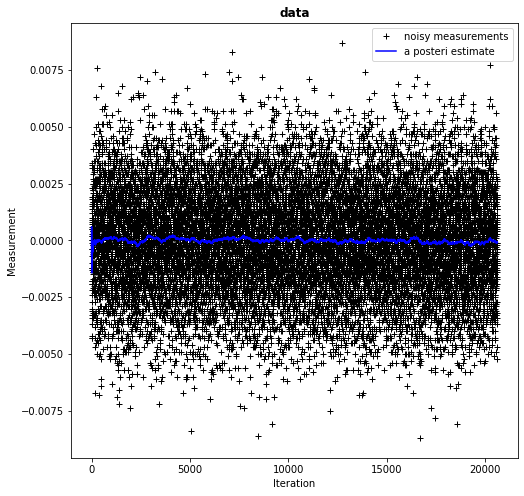

In [21]:
kalman_filter(train['os1'])
kalman_viz(train['os1'])
filtered = filtered.assign(a=xhat)

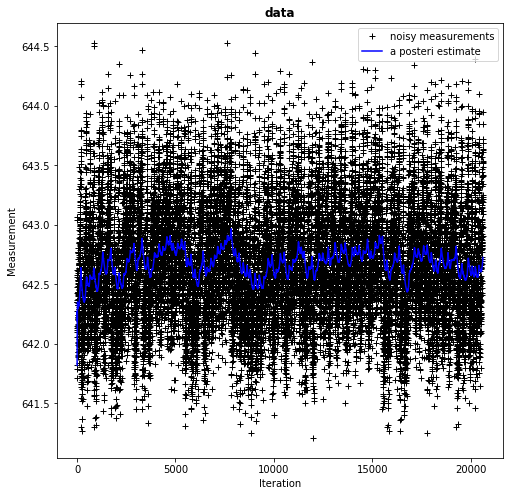

In [22]:
kalman_filter(train['m2'])
kalman_viz(train['m2'])
filtered = filtered.assign(b=xhat);

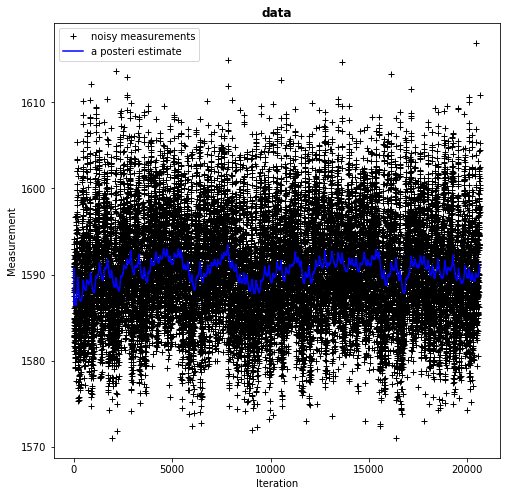

In [23]:
kalman_filter(train['m3'])
kalman_viz(train['m3'])
filtered = filtered.assign(c=xhat);

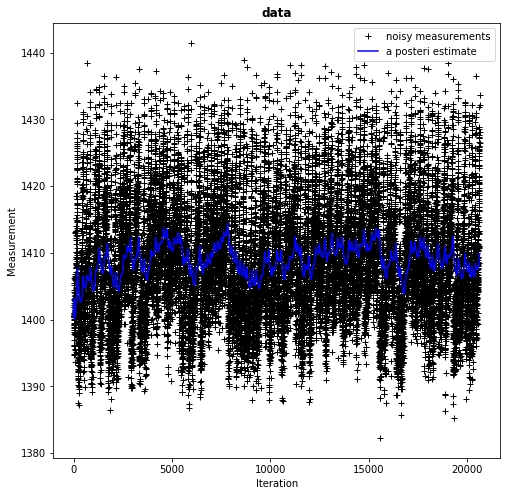

In [24]:
kalman_filter(train['m4'])
kalman_viz(train['m4'])
filtered = filtered.assign(d=xhat);

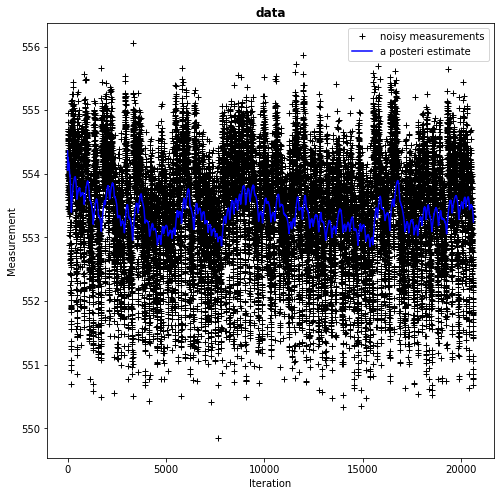

In [25]:
kalman_filter(train['m7'])
kalman_viz(train['m7'])
filtered = filtered.assign(e=xhat);

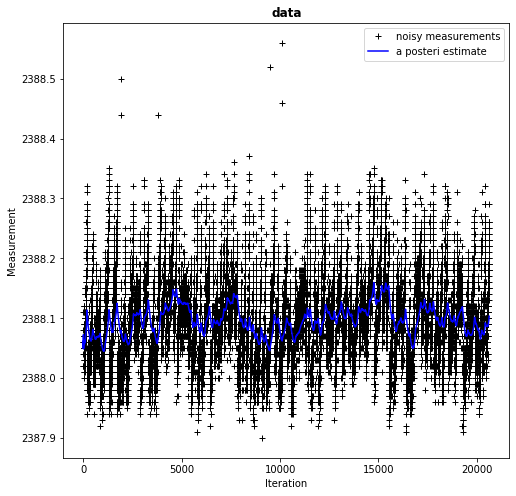

In [26]:
kalman_filter(train['m8'])
kalman_viz(train['m8'])
filtered = filtered.assign(f=xhat);

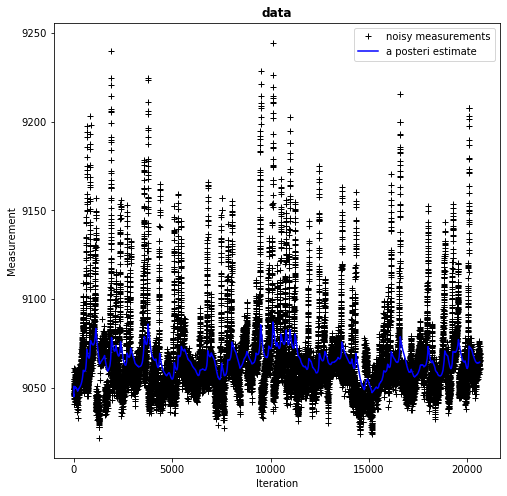

In [27]:
kalman_filter(train['m9'])
kalman_viz(train['m9'])
filtered = filtered.assign(g=xhat);

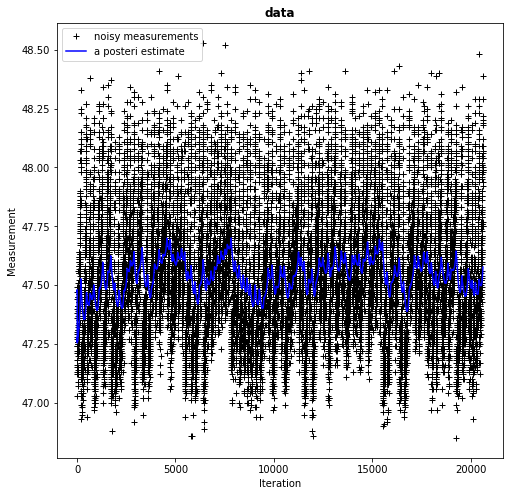

In [28]:
kalman_filter(train['m11'])
kalman_viz(train['m11'])
filtered = filtered.assign(h=xhat);

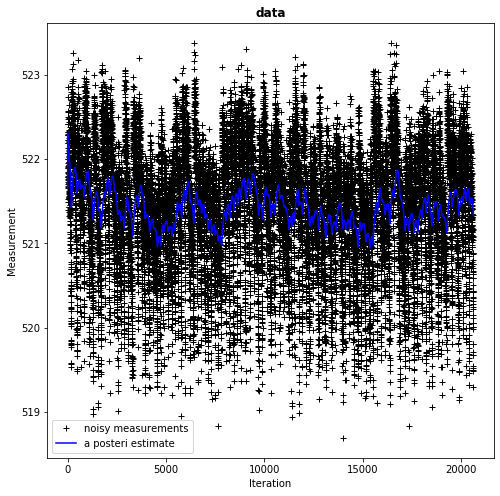

In [29]:
kalman_filter(train['m12'])
kalman_viz(train['m12'])
filtered = filtered.assign(i=xhat);

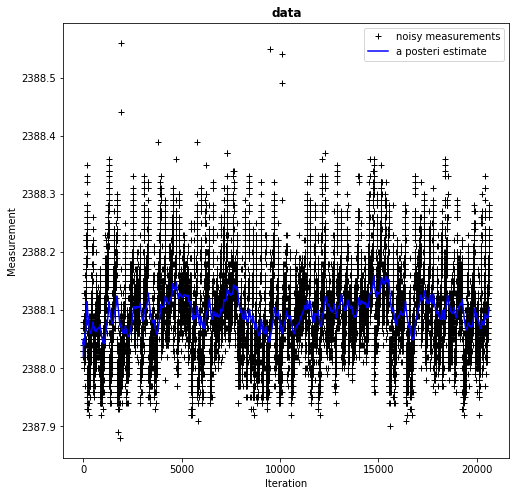

In [30]:
kalman_filter(train['m13'])
kalman_viz(train['m13'])
filtered = filtered.assign(j=xhat);

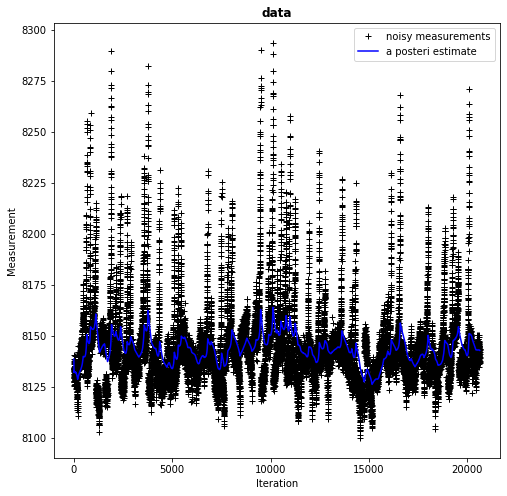

In [31]:
kalman_filter(train['m14'])
kalman_viz(train['m14'])
filtered = filtered.assign(k=xhat);

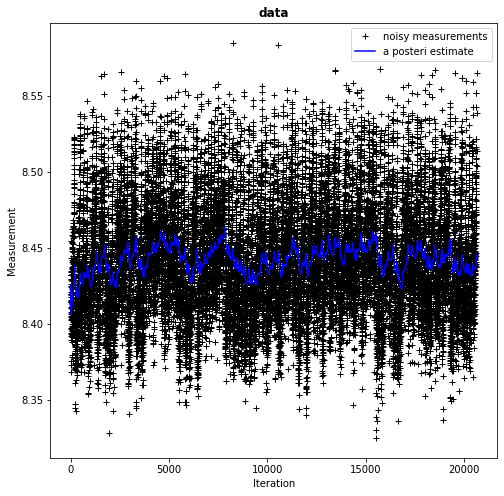

In [32]:
kalman_filter(train['m15'])
kalman_viz(train['m15'])
filtered = filtered.assign(l=xhat);

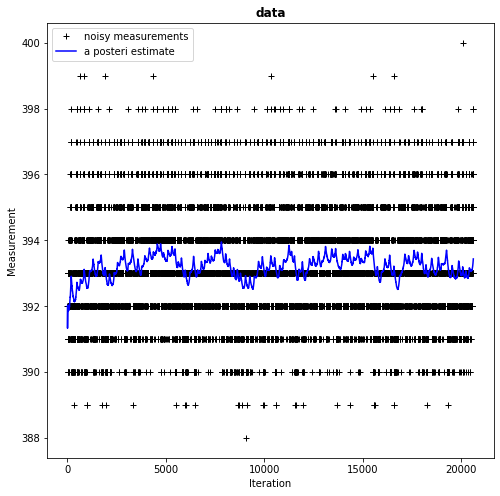

In [33]:
kalman_filter(train['m17'])
kalman_viz(train['m17'])
filtered = filtered.assign(m=xhat);

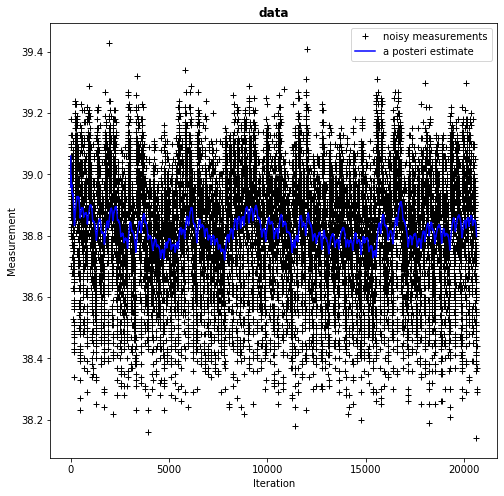

In [34]:
kalman_filter(train['m20'])
kalman_viz(train['m20'])
filtered = filtered.assign(n=xhat);

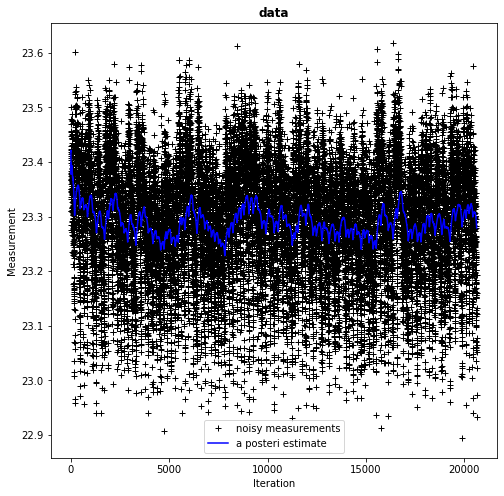

In [35]:
kalman_filter(train['m21'])
kalman_viz(train['m21'])
filtered = filtered.assign(o=xhat);

In [36]:
#check creatded df for accuracy
filtered.head()

,a,b,c,d,e,f,g,h,i,j,k,l,m,n,o
0,-0.000700,641.820000,1589.700000,1400.600000,554.360000,2388.060000,9046.190000,47.470000,521.660000,2388.020,8138.620000,8.419500,392.000000,39.060000,23.419000
1,0.000600,641.985001,1590.760005,1401.870006,554.054998,2388.050000,9045.129995,47.480000,521.970002,2388.045,8135.054982,8.425650,392.000000,39.030000,23.421300
2,-0.001033,642.106669,1589.836655,1402.646684,554.123333,2388.060000,9047.733373,47.409999,522.120004,2388.040,8134.446645,8.423033,391.333322,39.003333,23.395600
3,-0.000600,642.167504,1588.074929,1402.452506,554.205003,2388.072501,9048.170045,47.339997,522.305009,2388.050,8134.292478,8.409325,391.499998,38.972499,23.390174
4,-0.000860,642.208006,1587.029881,1403.206050,554.164000,2388.070000,9049.566120,47.327997,522.282006,2388.048,8134.193977,8.413340,391.800016,38.957998,23.393020


In [37]:
#scale data
scaler = StandardScaler()
train_cont_scale = pd.DataFrame(scaler.fit_transform(filtered), columns=filtered.columns)
#test_cont_scale = pd.DataFrame(scaler.fit_transform(test_cont), columns=test_cont.columns)

In [38]:
#set target
train_target = train['target']

### Feature Engineering through Model Stacking

A method that is gaining popularity is model stacking. This process runs data through specified models and utilizes the outputs as features for the final model. Since categorical data can hinder a linear regression model, we will take all of the categorical data and run it through an XGBRegressor on our target. We will use this output in our final model.

In [39]:
#create xgb instance with parameters
clf = xgb.XGBRegressor()
#fit data
clf.fit(train_cat, train_target)
#make predictions
train_preds = clf.predict(train_cat)
#run classification report and confusion matrix
train_cont_scale['cat_out'] = train_preds

C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


[13:02:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [40]:
#add back in target data to run comparative linear regression models to check model improvement
train_cont_scale['target'] = train_target
train_scale = train_cont_scale.join(train_cat)

In [41]:
train_scale.head()

,a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,cat_out,target,unit,cycle,os2
0,-7.467337,-7.890054,-0.645931,-3.711834,4.290231,-1.609509,-2.708184,-0.982421,1.208040,-3.302461,-0.768365,-2.619366,-3.679644,5.991849,5.256033,0.979451,1.000000,1,1,-0.0004
1,6.603845,-6.369410,0.244515,-3.139204,2.958604,-2.054229,-2.860452,-0.838249,2.775556,-2.210414,-1.318030,-1.896221,-3.679644,5.248814,5.350353,0.979451,0.994792,1,2,-0.0003
2,-11.075562,-5.248117,-0.531136,-2.789010,3.256952,-1.609503,-2.486482,-1.847465,3.534037,-2.428828,-1.411826,-2.203905,-5.736302,4.588332,4.296413,0.978479,0.989583,1,3,0.0003
3,-6.384965,-4.687465,-2.011054,-2.876562,3.613519,-1.053587,-2.423755,-2.856696,4.469514,-1.991996,-1.435596,-3.815843,-5.222120,3.824638,4.073937,0.974216,0.984375,1,4,0.0000
4,-9.199352,-4.314203,-2.888935,-2.536799,3.434501,-1.164778,-2.223213,-3.029702,4.353199,-2.079368,-1.450783,-3.343703,-4.296582,3.465492,4.190618,0.969479,0.979167,1,5,-0.0002


### Check model improvrment from original data

Now we will run an OLS linear regression model to compare results from our preprocessed data from the original dataset as this method produces fast results and a legible table to find insights.

#### Linear Regression with alterations

In [44]:
np.random.seed(123)
formula = 'target~unit+cycle+a+b+c+d+e+f+g+h+i+j+k+l+m+n+o+cat_out'
linreg=ols(formula, data=train_scale).fit()
linreg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                       0.955
Model:                            OLS   Adj. R-squared:                  0.955
Method:                 Least Squares   F-statistic:                 2.418e+04
Date:                Wed, 09 Oct 2019   Prob (F-statistic):               0.00
Time:                        13:04:39   Log-Likelihood:                 28299.
No. Observations:               20631   AIC:                        -5.656e+04
Df Residuals:                   20612   BIC:                        -5.641e+04
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.1957      0.005    -39.344      0.000      -0.205      -0.186
unit           0.0001   1.86e-05      6.980      0.000    9.34e-05       0.000
cycle          0.0007   2.14e-05     33.045      0.000       0.001       0.001
a              0.0100      0.001     17.774      0.000       0.009       0.011
b             -0.0150      0.004     -3.867      0.000      -0.023      -0.007
c             -0.0250      0.003     -7.938      0.000      -0.031      -0.019
d              0.0450      0.007      6.792      0.000       0.032       0.058
e             -0.0076      0.006     -1.266      0.206      -0.019       0.004
f             -0.0538      0.007     -7.726      0.000      -0.067      -0.040
g             -0.2354      0.014    -17.128      0.000      -0.262      -0.208
h             -0.0459      0.007     -6.425      0.000      -0.060      -0.032
i              0.0338      0.007      4.949      0.000       0.020       0.047
j              0.0786      0.007     10.541      0.000       0.064       0.093
k              0.2268      0.014     15.870      0.000       0.199       0.255
l             -0.0186      0.005     -3.507      0.000      -0.029      -0.008
m              0.0819      0.004     20.621      0.000       0.074       0.090
n             -0.0016      0.005     -0.335      0.738      -0.011       0.008
o              0.0239      0.005      5.238      0.000       0.015       0.033
cat_out        1.2229      0.005    226.904      0.000       1.212       1.233
==============================================================================
Omnibus:                      337.379   Durbin-Watson:                   0.027
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              501.853
Skew:                           0.185   Prob(JB):                    1.06e-109
Kurtosis:                       3.669   Cond. No.                     6.41e+03
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 6.41e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [48]:
RMSE = np.sqrt(np.mean(linreg.mse_total))
print(RMSE)

0.28867905198549926


In [49]:
train.head()

,unit,cycle,os1,os2,m2,m3,m4,m7,m8,m9,m11,m12,m13,m14,m15,m17,m20,m21,target
0,1,1,-0.0007,-0.0004,641.82,1589.70,1400.60,554.36,2388.06,9046.19,47.47,521.66,2388.02,8138.62,8.4195,392,39.06,23.4190,1.000000
1,1,2,0.0019,-0.0003,642.15,1591.82,1403.14,553.75,2388.04,9044.07,47.49,522.28,2388.07,8131.49,8.4318,392,39.00,23.4236,0.994792
2,1,3,-0.0043,0.0003,642.35,1587.99,1404.20,554.26,2388.08,9052.94,47.27,522.42,2388.03,8133.23,8.4178,390,38.95,23.3442,0.989583
3,1,4,0.0007,0.0000,642.35,1582.79,1401.87,554.45,2388.11,9049.48,47.13,522.86,2388.08,8133.83,8.3682,392,38.88,23.3739,0.984375
4,1,5,-0.0019,-0.0002,642.37,1582.85,1406.22,554.00,2388.06,9055.15,47.28,522.19,2388.04,8133.80,8.4294,393,38.90,23.4044,0.979167


#### Linear regression with scrubbed original data

In [46]:
np.random.seed(123)
formula_2 = 'target~unit+cycle+os2+m2+m3+m4+m7+m8+m9+m11+m12+m13+m15+m17+m20+m21'
model=ols(formula_2, data=train).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                       0.878
Model:                            OLS   Adj. R-squared:                  0.878
Method:                 Least Squares   F-statistic:                     9311.
Date:                Wed, 09 Oct 2019   Prob (F-statistic):               0.00
Time:                        13:04:58   Log-Likelihood:                 18098.
No. Observations:               20631   AIC:                        -3.616e+04
Df Residuals:                   20614   BIC:                        -3.603e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    394.3149     62.886      6.270      0.000     271.052     517.577
unit           0.0006   2.42e-05     24.406      0.000       0.001       0.001
cycle         -0.0029   1.48e-05   -196.199      0.000      -0.003      -0.003
os2            5.8134      2.393      2.429      0.015       1.123      10.504
m2            -0.0127      0.002     -5.595      0.000      -0.017      -0.008
m3            -0.0007      0.000     -4.117      0.000      -0.001      -0.000
m4            -0.0011      0.000     -6.685      0.000      -0.001      -0.001
m7             0.0112      0.002      6.767      0.000       0.008       0.014
m8            -0.0737      0.021     -3.459      0.001      -0.116      -0.032
m9            -0.0008   4.56e-05    -17.465      0.000      -0.001      -0.001
m11           -0.0626      0.006     -9.705      0.000      -0.075      -0.050
m12            0.0158      0.002      7.224      0.000       0.012       0.020
m13           -0.0882      0.021     -4.197      0.000      -0.129      -0.047
m15           -0.2130      0.034     -6.270      0.000      -0.280      -0.146
m17           -0.0024      0.001     -3.296      0.001      -0.004      -0.001
m20            0.0338      0.007      4.973      0.000       0.020       0.047
m21            0.0582      0.011      5.089      0.000       0.036       0.081
==============================================================================
Omnibus:                      180.149   Durbin-Watson:                   0.058
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              201.669
Skew:                           0.187   Prob(JB):                     1.61e-44
Kurtosis:                       3.309   Cond. No.                     8.94e+08
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.94e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [47]:
RMSE = np.sqrt(np.mean(model.mse_total))
print(RMSE)

0.28867905198549926


As the results show...the accuracy was significantly increased without sacrificing any loss. Now that we have a solid, clean and preprocessed set, we can select a model and run our unknown test data through to compare.

For reference: the following hidden code performed the GridSearchCV used to tweak our XGBRegressor model. It was hidden after the parameters were determined.

param_grid = {"learning_rate": [0.01,0.1,1],'max_depth': [2,6,10], \
                  'min_child_weight': [1,3,5],'n_estimators': [50,150,250]}
grid_search = GridSearchCV(xgbr, param_grid, n_jobs=-1, refit=True,cv=3)
grid_search.fit(train_xgb, train_target)
print("Best Parameter Combination Found During Grid Search:")
grid_search.best_params_

## Model Selection

### XGBRegressor Training

One of our models will be an XGBRegressor. In order to run our test data through, we will need to fit our training data into the model.

In [51]:
#prepare training data for XGB
train_xgb = train_scale.drop(['target'], axis=1)

In [52]:
train_xgb.head()

,a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,cat_out,unit,cycle,os2
0,-7.467337,-7.890054,-0.645931,-3.711834,4.290231,-1.609509,-2.708184,-0.982421,1.208040,-3.302461,-0.768365,-2.619366,-3.679644,5.991849,5.256033,0.979451,1,1,-0.0004
1,6.603845,-6.369410,0.244515,-3.139204,2.958604,-2.054229,-2.860452,-0.838249,2.775556,-2.210414,-1.318030,-1.896221,-3.679644,5.248814,5.350353,0.979451,1,2,-0.0003
2,-11.075562,-5.248117,-0.531136,-2.789010,3.256952,-1.609503,-2.486482,-1.847465,3.534037,-2.428828,-1.411826,-2.203905,-5.736302,4.588332,4.296413,0.978479,1,3,0.0003
3,-6.384965,-4.687465,-2.011054,-2.876562,3.613519,-1.053587,-2.423755,-2.856696,4.469514,-1.991996,-1.435596,-3.815843,-5.222120,3.824638,4.073937,0.974216,1,4,0.0000
4,-9.199352,-4.314203,-2.888935,-2.536799,3.434501,-1.164778,-2.223213,-3.029702,4.353199,-2.079368,-1.450783,-3.343703,-4.296582,3.465492,4.190618,0.969479,1,5,-0.0002


In [53]:
#XGBregressor used for training data only
xtrain, xtest, ytrain, ytest = train_test_split(train_xgb, train_target, test_size=.25, random_state=123)
#split all training data into test and train to validate measurements
#XGBRegressor with tweaked parameters using GridSearchCV
xgbr = xgb.XGBRegressor(learning_rate=0.1,max_depth=6,min_child_weight=5,n_estimators=50)
xgbr.fit(xtrain, ytrain)
# cross validataion - train
scores = cross_val_score(xgbr, xtrain, ytrain, cv=5)
print("Mean cross-validation score: %.4f" % scores.mean())
ypred_train = xgbr.predict(xtrain)
ypred_test = xgbr.predict(xtest)
# MSE/RMSE validation - train
mse_train = mean_squared_error(ytrain, ypred_train)
print("MSE: %.2f" % mse_train)
print("RMSE: %.2f" % np.sqrt(mse_train))
# cross validataion - test
scores = cross_val_score(xgbr, xtest, ytest, cv=5)
print("Mean cross-validation score: %.4f" % scores.mean())
# MSE/RMSE validation - test
mse_test = mean_squared_error(ytest, ypred_test)
print("MSE - Test: %.2f" % mse_test)
print("RMSE - Test: %.2f" % np.sqrt(mse_test))

[13:05:36] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:05:37] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[13:05:39] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[13:05:40] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[13:05:42] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[13:05:43] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Mean cross-validation score: 0.9873
MSE: 0.00
RMSE: 0.03
[13:05:44] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[13:05:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[13:05:45] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[13:05:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


C:\Users\perso\Anaconda3\envs\learn-env\lib\site-packages\xgboost\core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \


[13:05:46] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Mean cross-validation score: 0.9841
MSE - Test: 0.00
RMSE - Test: 0.03


## Testing on New Data

Now we can perform our preprocess steps on our test data.

### Kalman Filter

In [54]:
f_test = pd.DataFrame()
sz = len(test.index,)
# allocate space for arrays
xhat=np.zeros(sz)      # a posteri estimate of x
P=np.zeros(sz)         # a posteri error estimate
xhatminus=np.zeros(sz) # a priori estimate of x
Pminus=np.zeros(sz)    # a priori error estimate
K=np.zeros(sz)         # gain or blending factor
R = 1.0**2 # estimate of measurement variance, change to see effect

def kalman_filter(data):
# intial parameters
    z = data# observations
    Q = 1e-5 # process variance


# intial guesses
    xhat[0] = data[0]
    P[0] = 1.0

    for k in range(1,sz):
# time update
        xhatminus[k] = xhat[k-1]
        Pminus[k] = P[k-1]+Q

# measurement update
        K[k] = Pminus[k]/( Pminus[k]+R )
        xhat[k] = xhatminus[k]+K[k]*(z[k]-xhatminus[k])
        P[k] = (1-K[k])*Pminus[k]

def kalman_viz(data):
    plt.figure(figsize=(8,8))
    plt.plot(data,'k+',label='noisy measurements')
    plt.plot(xhat,'b-',label='a posteri estimate')
    plt.legend()
    plt.title('data', fontweight='bold')
    plt.xlabel('Iteration')
    plt.ylabel('Measurement')
    plt.show()

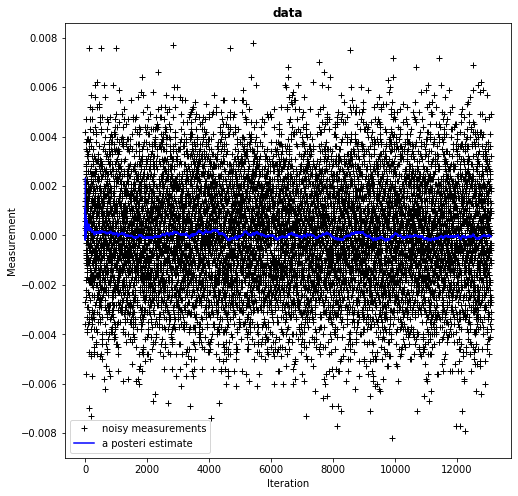

In [55]:
kalman_filter(test['os1'])
kalman_viz(test['os1'])
f_test = f_test.assign(a=xhat)

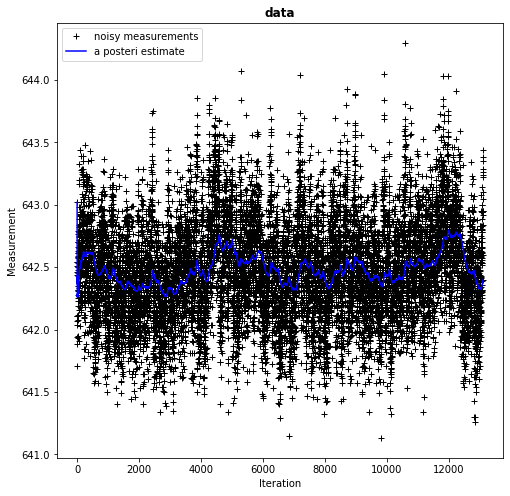

In [56]:
kalman_filter(test['m2'])
kalman_viz(test['m2'])
f_test = f_test.assign(b=xhat);

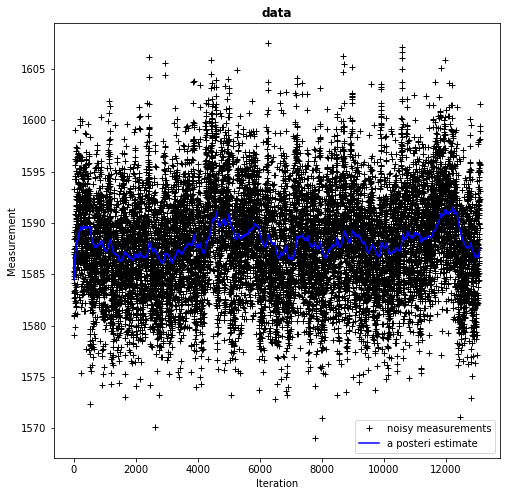

In [57]:
kalman_filter(test['m3'])
kalman_viz(test['m3'])
f_test = f_test.assign(c=xhat);

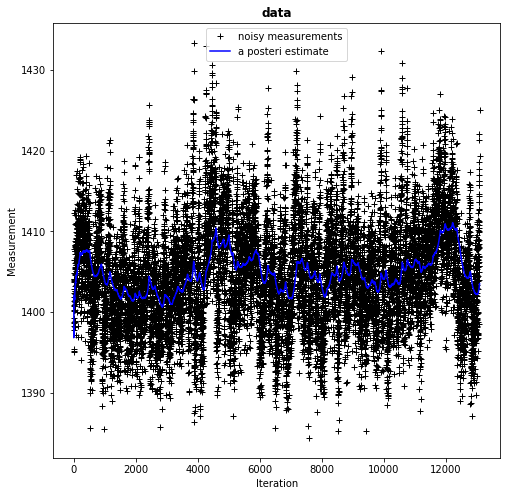

In [58]:
kalman_filter(test['m4'])
kalman_viz(test['m4'])
f_test = f_test.assign(d=xhat);

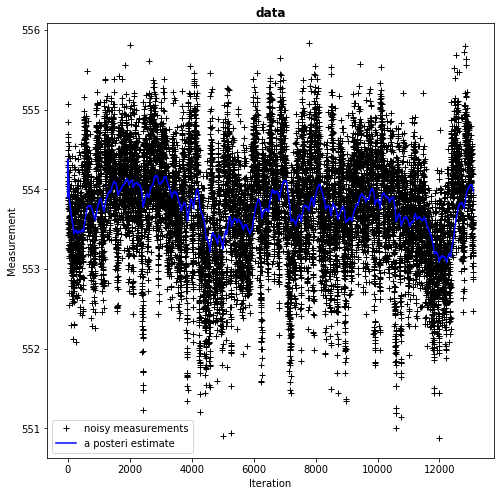

In [59]:
kalman_filter(test['m7'])
kalman_viz(test['m7'])
f_test = f_test.assign(e=xhat);

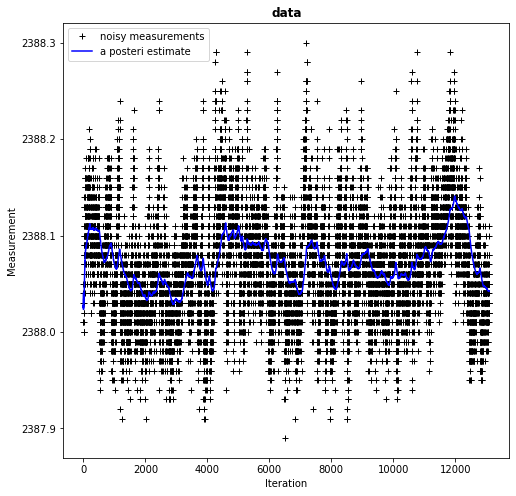

In [60]:
kalman_filter(test['m8'])
kalman_viz(test['m8'])
f_test = f_test.assign(f=xhat);

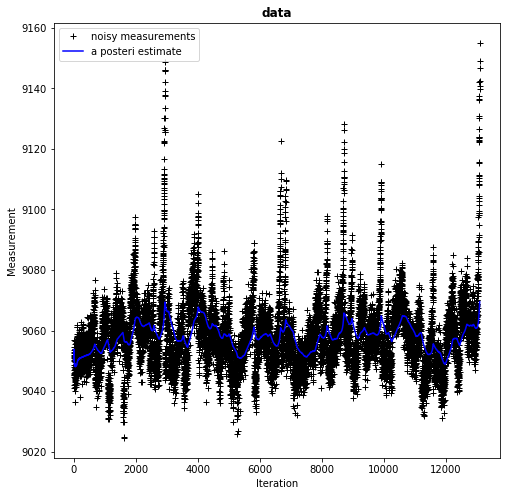

In [61]:
kalman_filter(test['m9'])
kalman_viz(test['m9'])
f_test = f_test.assign(g=xhat);

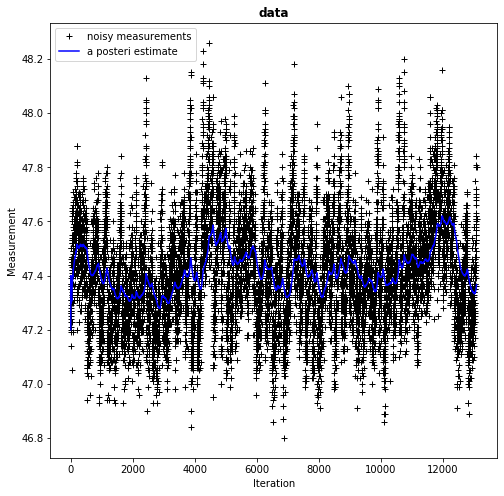

In [62]:
kalman_filter(test['m11'])
kalman_viz(test['m11'])
f_test = f_test.assign(h=xhat);

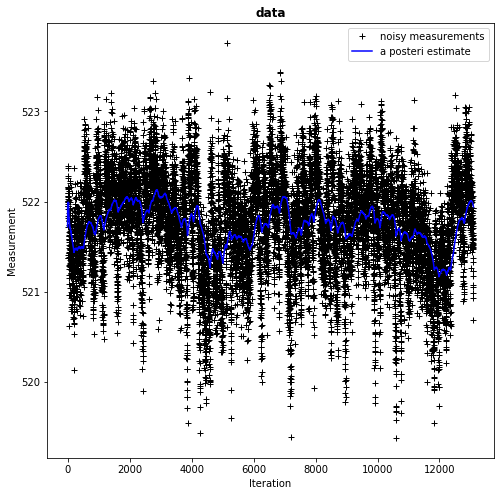

In [63]:
kalman_filter(test['m12'])
kalman_viz(test['m12'])
f_test = f_test.assign(i=xhat);

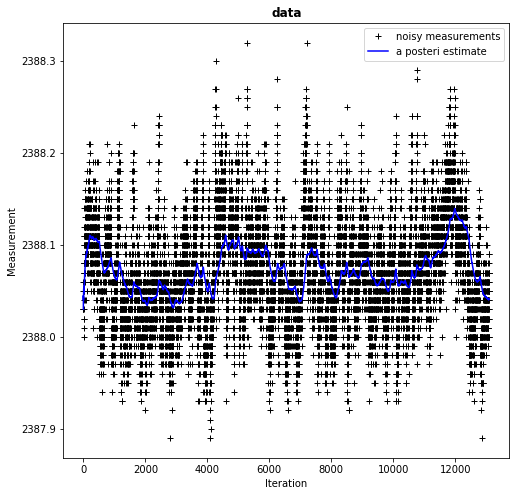

In [64]:
kalman_filter(test['m13'])
kalman_viz(test['m13'])
f_test = f_test.assign(j=xhat);

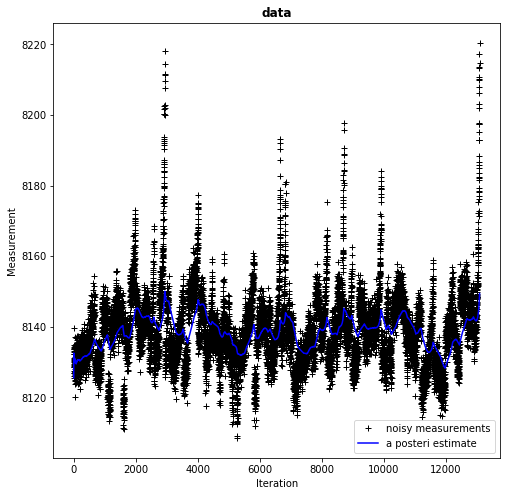

In [65]:
kalman_filter(test['m14'])
kalman_viz(test['m14'])
f_test = f_test.assign(k=xhat);

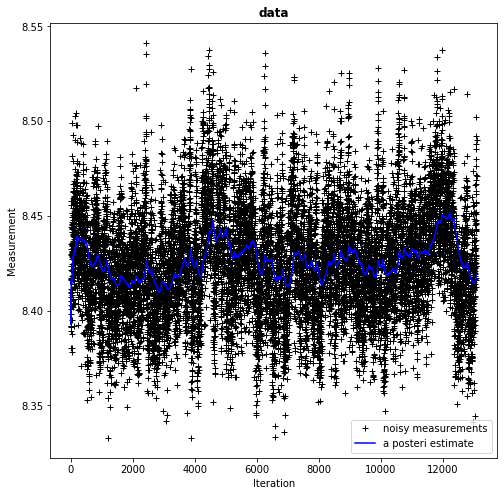

In [66]:
kalman_filter(test['m15'])
kalman_viz(test['m15'])
f_test = f_test.assign(l=xhat);

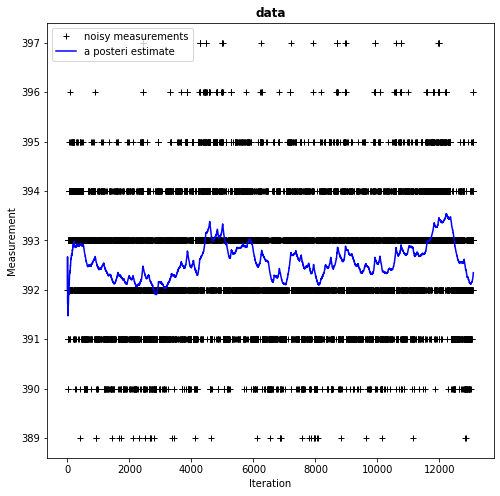

In [67]:
kalman_filter(test['m17'])
kalman_viz(test['m17'])
f_test = f_test.assign(m=xhat);

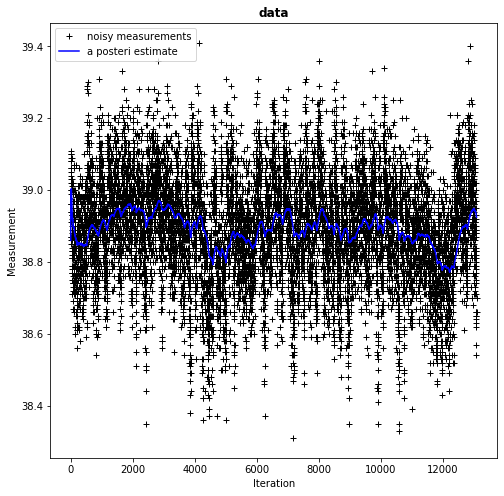

In [68]:
kalman_filter(test['m20'])
kalman_viz(test['m20'])
f_test = f_test.assign(n=xhat);

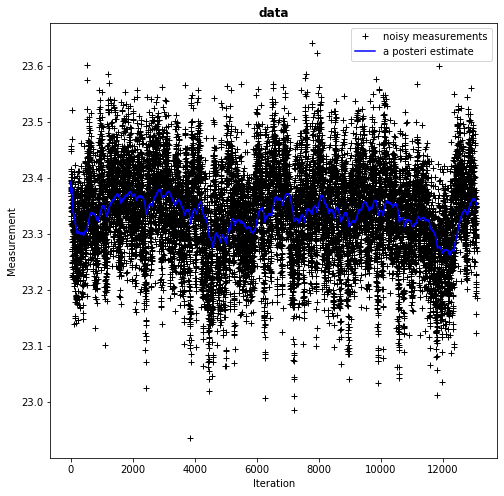

In [69]:
kalman_filter(test['m21'])
kalman_viz(test['m21'])
f_test = f_test.assign(o=xhat);

In [70]:
#creating a DataFrame with filtered data 
test_cont_scale = pd.DataFrame(scaler.fit_transform(f_test), columns=f_test.columns)

### Test data through XGBRegressor

Our first model we will test is our pretrained XGBRegressor. Our validation measurement will be root mean squared error.

In [71]:
#running the categorical variables through the above trained XGBRegressor
test_preds = clf.predict(test_cat)
#run classification report and confusion matrix
test_cont_scale['cat_out'] = test_preds

In [72]:
#updating dataframe with XGBRegressor outputs
test_scale = test_cont_scale.join(test_cat)

In [73]:
test_scale.head()

,a,b,c,d,e,f,g,h,i,j,k,l,m,n,o,cat_out,unit,cycle,os2
0,21.965111,4.733955,-2.387552,-2.926150,0.621712,-1.394237,-1.918267,-3.009081,-0.096857,-1.870209,-3.199072,-2.341586,-1.710575,-0.749029,1.492932,0.979451,1,1,0.0003
1,-1.873566,-0.988550,-1.054048,-3.547252,2.596146,-2.045366,-1.394264,-0.940757,0.965955,-1.206008,-1.461753,-3.735876,-0.229112,1.149303,1.845194,0.979451,1,2,-0.0003
2,-0.284262,-0.711877,-1.034356,-2.875681,2.228963,-1.683622,-1.010814,-0.251310,1.014263,-1.427412,-1.666319,-1.818936,0.264713,2.256673,2.286985,0.978479,1,3,0.0001
3,9.807760,-0.617223,-1.619542,-1.974428,2.003801,-1.719798,-1.538533,-0.664992,0.325829,-1.316708,-1.595730,-2.327585,-0.969881,2.335766,2.090411,0.974216,1,4,0.0000
4,10.522897,-0.438111,-1.452419,-1.834401,1.943527,-1.915148,-1.891666,-0.830467,0.656772,-1.427415,-1.719337,-2.377424,-2.303265,2.335762,2.278425,0.969479,1,5,0.0000


In [74]:
#running updated data through pre-trained XGBRegressor for all data
ypred_test = xgbr.predict(test_scale)

In [75]:
ypred_test

array([0.9908421 , 0.98904216, 0.9827837 , ..., 0.02758327, 0.02758327,
       0.02120897], dtype=float32)

In [76]:
test['pred'] = ypred_test

In [77]:
#converting result percentages to remaining useful life 
unit = 1
pred = []
while unit <= 100:
    min_perc = min(test['pred'][test['unit']==unit].values)
    max_cycle = max(test['cycle'][test['unit']==unit].values)
    total_ul = max_cycle / (1 - min_perc)
    rul = total_ul - max_cycle
    pred.append(rul)
    unit = unit + 1

In [78]:
ytrue = test_target

In [79]:
#provided true values contain an extra column that needs removed
ytrue.drop(1, axis=1, inplace=True)

In [80]:
#validate loss of XGBRegressor results 
mse_test = mean_squared_error(pred, ytrue)
print("MSE: %.2f" % mse_test)
print("RMSE: %.2f" % np.sqrt(mse_test))

MSE: 2419.63
RMSE: 49.19


The was an expected increase in our loss. 

### Test data through Deep Neural Network

Now we will run the preprocessed data through a Deep Neural Network. After some testing, the below settings did produce the best results at the time of this report.

In [81]:
train_scale = train_scale.drop('target', axis=1)

In [134]:
#create model with final layer set to 1 for regression
dnn = models.Sequential()
dnn.add(layers.Dense(12,activation='relu', activity_regularizer=regularizers.l2(0.01),\
                     input_shape=(19,)))
dnn.add(layers.Dense(14, activation='relu'))
dnn.add(layers.Dense(14, activation='relu'))
dnn.add(layers.Dense(1))


In [135]:
#compile model and take a look
dnn.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])
dnn.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 12)                240       
_________________________________________________________________
dense_7 (Dense)              (None, 14)                182       
_________________________________________________________________
dense_8 (Dense)              (None, 14)                210       
_________________________________________________________________
dense_9 (Dense)              (None, 1)                 15        
Total params: 647
Trainable params: 647
Non-trainable params: 0
_________________________________________________________________


In [136]:
#fit model to training data
np.random.seed(42)
dnn.fit(train_scale,train_target, epochs=20, batch_size=50)

Epoch 1/20
20631/20631 [==============================] - 2s 109us/step - loss: 361.8590 - mean_absolute_error: 0.4715
Epoch 2/20
20631/20631 [==============================] - ETA: 0s - loss: 0.0942 - mean_absolute_error: 0.245 - 2s 83us/step - loss: 0.0941 - mean_absolute_error: 0.2454
Epoch 3/20
20631/20631 [==============================] - 2s 83us/step - loss: 0.0703 - mean_absolute_error: 0.2013
Epoch 4/20
20631/20631 [==============================] - 2s 82us/step - loss: 0.0545 - mean_absolute_error: 0.1700
Epoch 5/20
20631/20631 [==============================] - 2s 82us/step - loss: 0.0455 - mean_absolute_error: 0.1473
Epoch 6/20
20631/20631 [==============================] - 2s 88us/step - loss: 0.0429 - mean_absolute_error: 0.1390
Epoch 7/20
20631/20631 [==============================] - 2s 84us/step - loss: 0.0416 - mean_absolute_error: 0.1372
Epoch 8/20
20631/20631 [==============================] - 2s 83us/step - loss: 0.0397 - mean_absolute_error: 0.1328
Epoch 9/20
2063

In [137]:
#predict test data using pretrained NN
np.random.seed(42)
predict = dnn.predict(test_scale)

In [138]:
predict

array([[-1.2203919 ],
       [ 0.8277192 ],
       [ 0.9361093 ],
       ...,
       [ 0.28298903],
       [ 0.28298903],
       [ 0.28298903]], dtype=float32)

In [139]:
predict.shape

(13096, 1)

In [166]:
#add predictions to dataframe
test_scale['predict'] = predict

In [167]:
#converting result percentages to remaining useful life 
unit = 1
pred = []
while unit <= 100:
    min_perc = min(test_scale['predict'][test_scale['unit']==unit].values)
    max_cycle = max(test_scale['cycle'][test_scale['unit']==unit].values)
    total_ul = max_cycle / (1 - min_perc)
    rul = total_ul - max_cycle
    pred.append(rul)
    unit = unit + 1

In [168]:
#validate loss of DNN
mse_test = mean_squared_error(pred, ytrue)
print("MSE: %.2f" % mse_test)
print("RMSE: %.2f" % np.sqrt(mse_test))

MSE: 3105.19
RMSE: 55.72


The loss has improved compared to the XGBRegressor model.

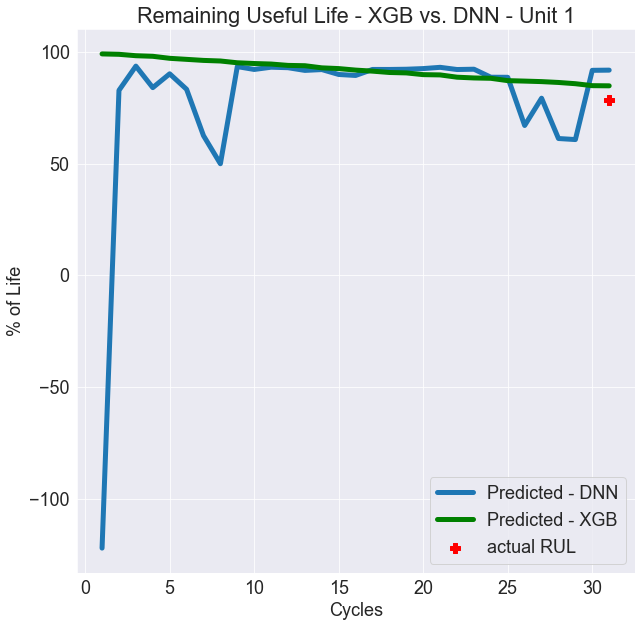

In [169]:
#visualize difference between XGB, DNN and actual values
sns.set_style('darkgrid')
plt.figure(figsize = (10,10))
plt.scatter(31, 78.3, marker = 'P', s=100, label='actual RUL', c='red')
plt.plot(test['cycle'][test['unit']==1], test['predict'][0:31]*100, lw=5, \
         label='Predicted - DNN')
plt.plot(test['cycle'][test['unit']==1], ypred_test[0:31]*100, lw=5, \
         c='green', label='Predicted - XGB')
plt.legend()
plt.xlabel('Cycles')
plt.ylabel('% of Life')
plt.title('Remaining Useful Life - XGB vs. DNN - Unit 1')
plt.rcParams.update({'font.size': 18})

Above, you can see a visualization of the differences in results between running an XGBRegressor and a Deep Neural Network compared to the true label. It truly shows how a neural network 'learns' as it iterates, while the XGBRegressor runs in an expected linear progression.

In [298]:
#function to define a unit and show results from XGB and DNN
def plot_unit_results(unit):
    rul = unit - 1
    sns.set_style('darkgrid')
    plt.figure(figsize = (10,10))
    plt.scatter(max(test_scale['cycle'][test_scale['unit']==unit].values), \
                -100*(-1+(max(test_scale['cycle'][test_scale['unit']==unit].values)) / \
                      (ytrue[rul:unit] + (max(test_scale['cycle'][test_scale['unit']==unit].values)))), \
                marker='P', s=100, label='actual RUL', c='red')
    plt.plot(test_scale['cycle'][test_scale['unit']==unit], test_scale['predict'][test_scale['unit']==unit]*100, lw=5, \
             label='Predicted - DNN')
    plt.plot(test['cycle'][test['unit']==unit], test['pred'][test['unit']==unit]*100, lw=5, \
         c='green', label='Predicted - XGB')
    plt.legend()
    plt.xlabel('Cycles')
    plt.ylabel('% of Life')
    plt.title('Remaining Useful Life - XGB vs. DNN - Unit {0}'.format(unit))
    plt.rcParams.update({'font.size': 18})

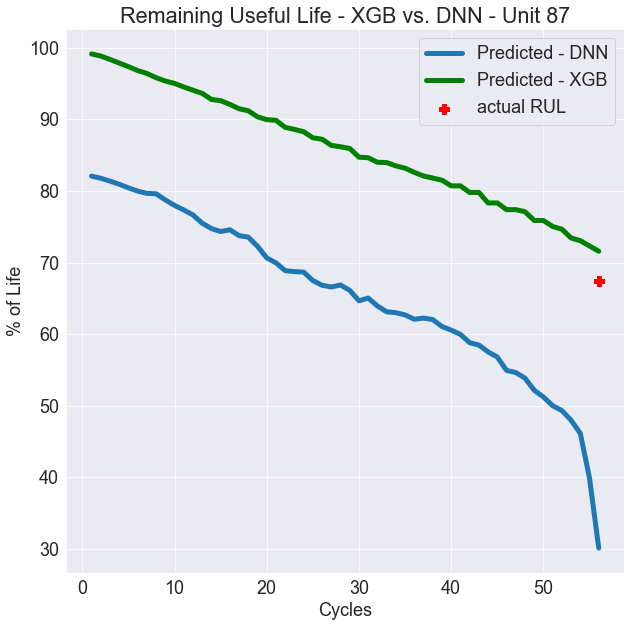

In [303]:
plot_unit_results(87)

## Conclusion

Through use of the Kalman filter and stacking a model using the outputs from categorical prediction, the results were positive. Performing both preprocessing techniques did improve accuracy and reduced loss with the training data.

When performed on unknown data, the XGBoost model did outperform the Deep Neural Network. As of this time, the neural network and the XGBRegressor actually closely performed the same. While adding activation nodes has shown not to improve performance, there are still some measures that can be taken to slightly improve the performance of the neural network.


There is still the issue of properly labeled measurements meaning what type of measurements are being taken. There may be different techniques that better perform on certain types of measurements over others. 



